# Run Published Implementations

# Faster R-CNN

<br />

"Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks"


Shaoqing Ren, Kaiming He, Ross Girshick, and Jian Sun


https://arxiv.org/pdf/1506.01497.pdf

<br />

I am going to use the following implementation of Faster R-CNN to do object detection by Keras.


https://github.com/duckrabbits/ObjectDetection/tree/master

## [Task 1] Fit and Predict

<br />

I will use the following dataset to fit and predict.

<br />

"The Simpsons Characters Data" on Kaggle


https://www.kaggle.com/alexattia/the-simpsons-characters-dataset

## [Task 2] Paper vs Implementation

<br />

I do code reading and enumerate some important parts of the paper of Faster R-CNN, then find codes applying to the parts.

# YOLOv3

<br />

"YOLOv3: An Incremental Improvement"


Joseph Redmon, Ali Farhadi


https://pjreddie.com/media/files/papers/YOLOv3.pdf

<br />

Next, I fit and predict the Simpsons' dataset by the following implementation of Keras of YOLOv3.


https://github.com/qqwweee/keras-yolo3

## [Task 3] Predict by Pre-Trained Weights

<br />

Download pre-trained weights from the following.


https://pjreddie.com/darknet/yolo/

In [1]:
from IPython.display import Image, display_png

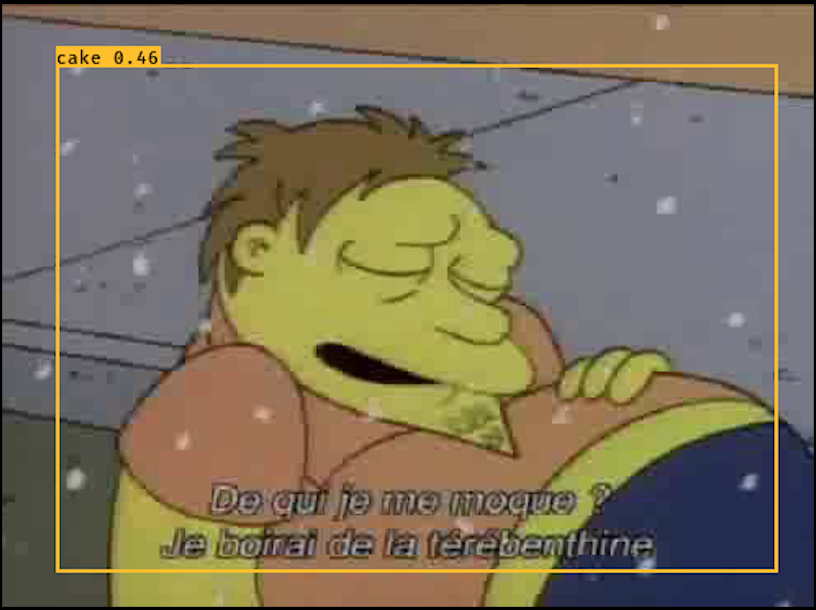

In [2]:
display_png(Image("/Users/kazukiegusa/git-dic/dic/ml/sprint18/スクリーンショット 2019-03-13 17.05.11.png"))

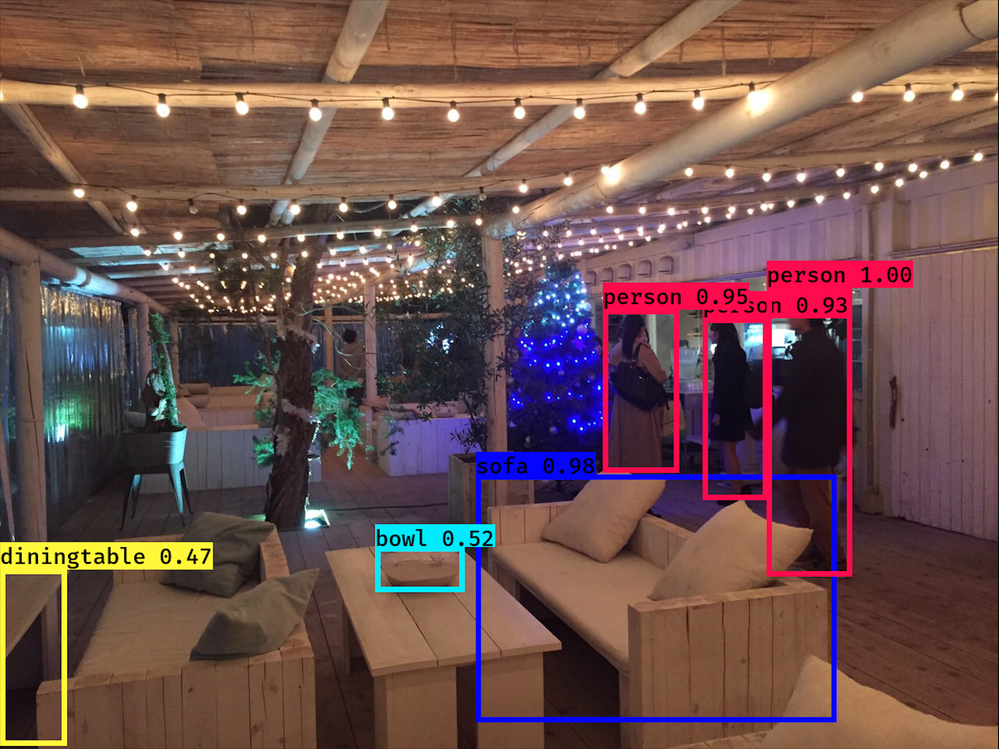

In [3]:
display_png(Image("/Users/kazukiegusa/git-dic/dic/ml/sprint18/スクリーンショット 2019-03-13 17.05.41.png"))

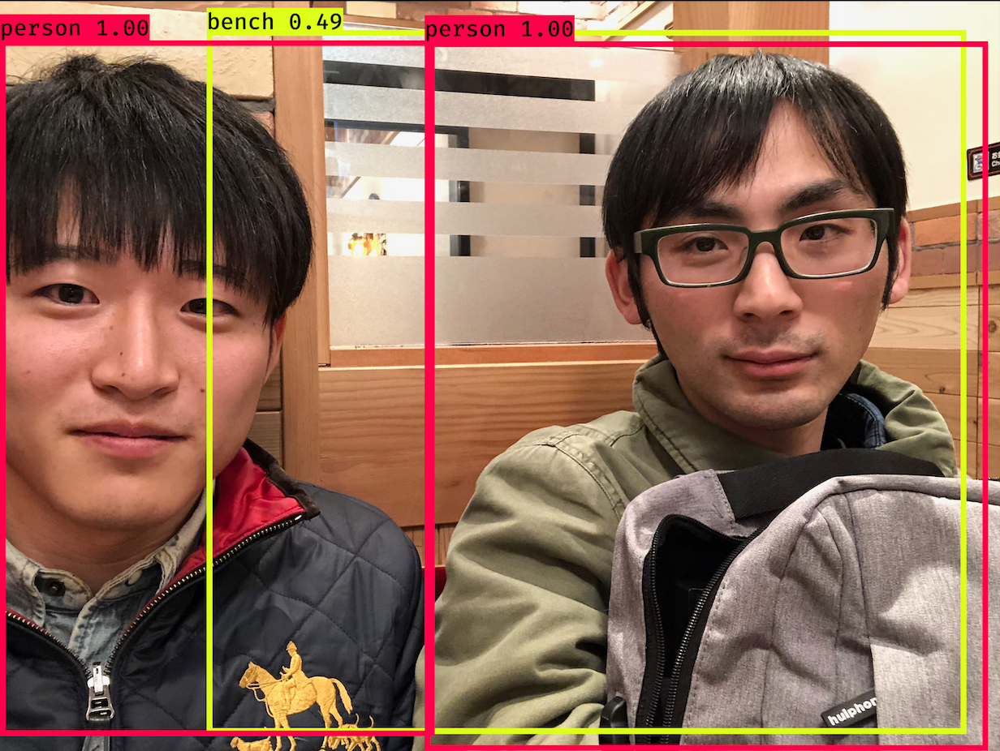

In [4]:
display_png(Image("/Users/kazukiegusa/git-dic/dic/ml/sprint18/スクリーンショット 2019-03-13 17.06.53.png"))

## [Task 4] Create Files for Fitting

<br />

I am going to fit a new dataset, the Simptons dataset. I need to change the form of the annotation file.

In [5]:
import pandas as pd
import numpy as np

In [6]:
# Read the annotation file

df = pd.read_csv("old_annotation.txt", names=("image_file_path", "x_min", "y_min", "x_max", "y_max", "class_id"))

In [7]:
df

,image_file_path,x_min,y_min,x_max,y_max,class_id
0,simpsons_dataset/abraham_grampa_simpson/pic_00...,57,72,52,72,abraham_grampa_simpson
1,simpsons_dataset/abraham_grampa_simpson/pic_00...,80,31,337,354,abraham_grampa_simpson
2,simpsons_dataset/abraham_grampa_simpson/pic_00...,128,48,285,407,abraham_grampa_simpson
3,simpsons_dataset/abraham_grampa_simpson/pic_00...,72,126,158,275,abraham_grampa_simpson
4,simpsons_dataset/abraham_grampa_simpson/pic_00...,123,61,294,416,abraham_grampa_simpson
5,simpsons_dataset/abraham_grampa_simpson/pic_00...,115,18,498,413,abraham_grampa_simpson
6,simpsons_dataset/abraham_grampa_simpson/pic_00...,171,47,423,413,abraham_grampa_simpson
7,simpsons_dataset/abraham_grampa_simpson/pic_00...,120,53,381,409,abraham_grampa_simpson
8,simpsons_dataset/abraham_grampa_simpson/pic_00...,149,56,398,406,abraham_grampa_simpson
9,simpsons_dataset/abraham_grampa_simpson/pic_00...,205,41,470,456,abraham_grampa_simpson


In [8]:
# Create a dictionary of class labels

class_mapping = {label:idx for idx, label in enumerate(np.unique(df["class_id"]))}

In [9]:
class_mapping

{'abraham_grampa_simpson': 0,
 'apu_nahasapeemapetilon': 1,
 'bart_simpson': 2,
 'charles_montgomery_burns': 3,
 'chief_wiggum': 4,
 'comic_book_guy': 5,
 'edna_krabappel': 6,
 'homer_simpson': 7,
 'kent_brockman': 8,
 'krusty_the_clown': 9,
 'lisa_simpson': 10,
 'marge_simpson': 11,
 'milhouse_van_houten': 12,
 'moe_szyslak': 13,
 'ned_flanders': 14,
 'nelson_muntz': 15,
 'principal_skinner': 16,
 'sideshow_bob': 17}

In [10]:
# Creates a dataframe of the keys of the dicitonary

df_class_mapping = pd.DataFrame(class_mapping.keys())

In [11]:
df_class_mapping

,0
0,abraham_grampa_simpson
1,apu_nahasapeemapetilon
2,bart_simpson
3,charles_montgomery_burns
4,chief_wiggum
5,comic_book_guy
6,edna_krabappel
7,homer_simpson
8,kent_brockman
9,krusty_the_clown


In [12]:
# Write it to a txt file

df_class_mapping.to_csv("simpsons_classes.txt", index=False, header=False)

In [13]:
# Replace the class ids with integers

df["class_id"] = df["class_id"].map(class_mapping)

In [14]:
df

,image_file_path,x_min,y_min,x_max,y_max,class_id
0,simpsons_dataset/abraham_grampa_simpson/pic_00...,57,72,52,72,0
1,simpsons_dataset/abraham_grampa_simpson/pic_00...,80,31,337,354,0
2,simpsons_dataset/abraham_grampa_simpson/pic_00...,128,48,285,407,0
3,simpsons_dataset/abraham_grampa_simpson/pic_00...,72,126,158,275,0
4,simpsons_dataset/abraham_grampa_simpson/pic_00...,123,61,294,416,0
5,simpsons_dataset/abraham_grampa_simpson/pic_00...,115,18,498,413,0
6,simpsons_dataset/abraham_grampa_simpson/pic_00...,171,47,423,413,0
7,simpsons_dataset/abraham_grampa_simpson/pic_00...,120,53,381,409,0
8,simpsons_dataset/abraham_grampa_simpson/pic_00...,149,56,398,406,0
9,simpsons_dataset/abraham_grampa_simpson/pic_00...,205,41,470,456,0


In [58]:
# Replace a first "," of each row with a space

# Extract each column
a = df.image_file_path.astype(str)
b = df.x_min.astype(str)
c = df.y_min.astype(str)
d = df.x_max.astype(str)
e = df.y_max.astype(str)
f = df.class_id.astype(str)

# Join them
annot = a + " " + b + "," + c + "," + d + "," + e + "," + f

In [59]:
annot

0       simpsons_dataset/abraham_grampa_simpson/pic_00...
1       simpsons_dataset/abraham_grampa_simpson/pic_00...
2       simpsons_dataset/abraham_grampa_simpson/pic_00...
3       simpsons_dataset/abraham_grampa_simpson/pic_00...
4       simpsons_dataset/abraham_grampa_simpson/pic_00...
5       simpsons_dataset/abraham_grampa_simpson/pic_00...
6       simpsons_dataset/abraham_grampa_simpson/pic_00...
7       simpsons_dataset/abraham_grampa_simpson/pic_00...
8       simpsons_dataset/abraham_grampa_simpson/pic_00...
9       simpsons_dataset/abraham_grampa_simpson/pic_00...
10      simpsons_dataset/abraham_grampa_simpson/pic_00...
11      simpsons_dataset/abraham_grampa_simpson/pic_00...
12      simpsons_dataset/abraham_grampa_simpson/pic_00...
13      simpsons_dataset/abraham_grampa_simpson/pic_00...
14      simpsons_dataset/abraham_grampa_simpson/pic_00...
15      simpsons_dataset/abraham_grampa_simpson/pic_00...
16      simpsons_dataset/abraham_grampa_simpson/pic_00...
17      simpso

In [61]:
# Write it to a txt file

annot.to_csv("annotation.txt", index=False, header=False, sep='"')

## [Task 5] Fit

<br />

I am going to fit the dataset by using the file I created above.

## [Task 6] Paper vs Implementation

<br />

I do code reading and enumerate some important parts of the paper of YOLOv3, then find codes applying to the parts.